# Homework Assignment 1

This homework assignment, as well as the first lab assignment, will introduce you to the Colab notebook enviroment and python. The Colab notebook environment allows you to combine cells with python code and cells with text (markdown cells). Text cells can include "latex" mathematical formulas. Such formulas can be written in the inline mode, for example, $(x+y)^2=x^2+2xy+y^2$. Important or longer formulas may look better in a show mode, e.g. $$1=\sum_{n=1}^{\infty}\left(\frac{1}{2}\right)^n.$$
Latex is commonly used for scientific writing and you should use it for the written parts of your assignments. You should use text cells (markdown cells) to answer written questions or to present your explanations/comments in notebook reports with code. A list of common mathematical symbols in latex can be easily found online (e.g. https://oeis.org/wiki/List_of_LaTeX_mathematical_symbols). You can also find many online resources explaining latex for matematical equations, e.g. https://en.wikibooks.org/wiki/LaTeX/Advanced_Mathematics.

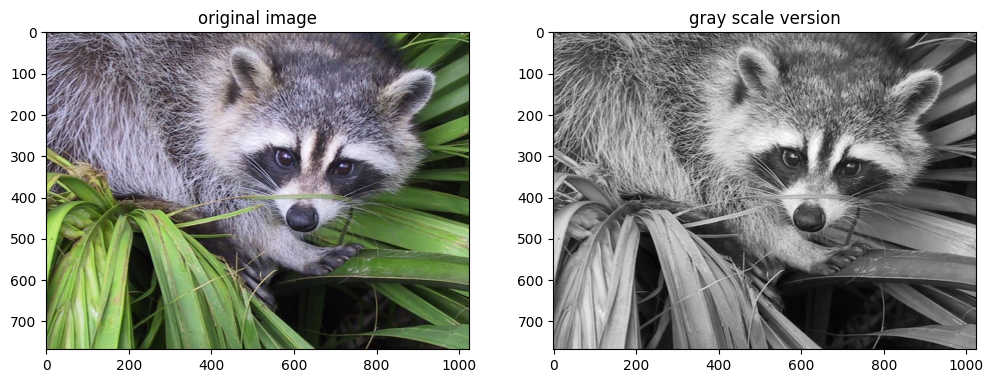

In [10]:
# This cell loads some libraries and a test image you can use. Feel free to load your own images
# but you must save them in an "images" subdirectory before creating .zip for your submission.

%matplotlib inline
# NOTE: all "magic" options for backend plotting are: inline, notebook, and "external" (default)
# see  http://ipython.readthedocs.io/en/stable/interactive/plotting.html for details
import numpy as np
import matplotlib
import matplotlib.image as image
import matplotlib.pyplot as plt
from scipy import misc
import scipy
from skimage.color import rgb2gray
import cv2

im = scipy.datasets.face()     # a sample image in misc library
#im=image.imread("../images/IMG_3306.jpg") # another image (loaded from your file), uncomment one

plt.figure(1,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(rgb2gray(im),cmap="gray")
plt.title("gray scale version")
plt.show()

# Problem 1: NumPy Basics

Complete each of the following exercises using NumPy operations to generate the desired output. You may find this guide to NumPy to be helpful: https://numpy.org/doc/2.2/user/absolute_beginners.html

![Image Description](https://drive.google.com/uc?export=view&id=1sbCuFt4_Kypjl3Hk_PfnAM_1ytAdDu5b)

(a) Point-wise multiply A with B and set it to C.

(b) Calculate the inner product of the 2nd and 3rd row of C.

(c) Find the minimum and maximum values and their corresponding row and column indices in matrix C. If there are multiple min/max values, you must list all their indices.

In [ ]:
import numpy as np
#A
a = np.array([[3,9,5,1],[4,25,4,3],[63,13,23,9],[6,32,77,0],[12,8,6,1]])
b = np.array([[0,1,0,1],[0,1,1,0],[0,0,0,1],[1,1,0,1],[0,1,0,0]])

c = np.multiply(a,b)
print(c)
print("--------------------------------------")

#B
inner_prod_c = np.inner(c[1],c[2])
print(inner_prod_c)
print("--------------------------------------")

#C

for x in c:
  min = np.min(x)
  max = np.max(x)

  min_index = np.argwhere(x == min)
  max_index = np.argwhere(x == max)

  print(f"Max: {max}, Index: {max_index}")
  print(f"Min: {min}, Index: {min_index}")
  print("--------------------------------------")

[[ 0  9  0  1]
 [ 0 25  4  0]
 [ 0  0  0  9]
 [ 6 32  0  0]
 [ 0  8  0  0]]
--------------------------------------
0
--------------------------------------
Max: 9, Index: [[1]]
Min: 0, Index: [[0]
 [2]]
--------------------------------------
Max: 25, Index: [[1]]
Min: 0, Index: [[0]
 [3]]
--------------------------------------
Max: 9, Index: [[3]]
Min: 0, Index: [[0]
 [1]
 [2]]
--------------------------------------
Max: 32, Index: [[1]]
Min: 0, Index: [[2]
 [3]]
--------------------------------------
Max: 8, Index: [[1]]
Min: 0, Index: [[0]
 [2]
 [3]]
--------------------------------------


# Problem 2: Image transform: from color to gray

#####  Use the following cells to write your own python functions that take an arbitrary RGB image and outputs its grayscale version. The functions' input should be an RGB image. The computed grayscale image should be a 2D array of the same size as the input image. You should write your own code for converting colored images to grayscale images without using any standard functions like $rgb2gray$ from "skimage" in the cell above, or any other image library for python.  Treat greyscale value as a direct $average$ of the corresponding R G and B values. You should write three versions A, B, and C, as detailed in each cell below. In addition to completing the functions, answer the question (a) below.

In [ ]:
# Solution A: (for-loops)
# In this version you should explicitly use two nested for-loops traversing individual pixels
# of the input image, computing the average of R, G, and B values for each pixel, and copying them
# to the corresponding element of the output matrix (gray-scale image).

def toGrayScale_A(color_image):
    input_image = np.array(color_image)
    height, width, channels = input_image.shape # side note: the _ is the denotation for the amount of color channels in the image. (h, w, channels)

    gray_image = np.zeros((height,width), dtype=np.uint8) # dtype is the datatype, np.uint8 is numpy unsigned 8-bit integer. Allows us to store values from 0 to 255 for the grayscale format.
    for i in range(height):
      for j in range(width):
        r, g, b = input_image[i,j]
        gray_image[i,j] = np.average([r,g,b])

    return gray_image


In [ ]:
# Solution B: (basic numpy operators for matrix operations)
# In the next two versions you can't use for-loops (or other loops) explicitly traversing pixels.
# In B below you should first separate image colors into individual 2D arrays (matrices) R,G and B
# using "slicing" or "reshaping" and then compute the average of these matrices 0.3333*(A+B+C) directly
# using numpy operators + and * for adding and scaling matrices.
# HINT: your code may look like a linear algebraic expresion.
def toGrayScale_B(color_image):
    input_image = np.array(color_image)
    # input_images has 3 dimensions: (h, w, channels). So to extract the Red channel, I need to slice from there.
    r = input_image[:, :, 0] # this is saying to go through the h and w dimensions, but to slice the channel dimension at index 0;
    g = input_image[:, :, 1] # this is slicing the green channel from the channel dimension.
    b = input_image[:, :, 2] # same for blue.

    gray_image = 0.3333 * (r + g + b)
    return gray_image


In [2]:
# Solution C: (vectorized functions)
# In this version you should use numpy function 'dot' applying it
# directly to the colored image (3d array) and vector [0.33,0.33,0.33] defining weights
# for each color component.
def toGrayScale_C(color_image):
    input_image = np.array(color_image)
    weighted_vector = np.array([0.33,0.33,0.33])

    gray_image = np.dot(input_image, weighted_vector)
    return gray_image


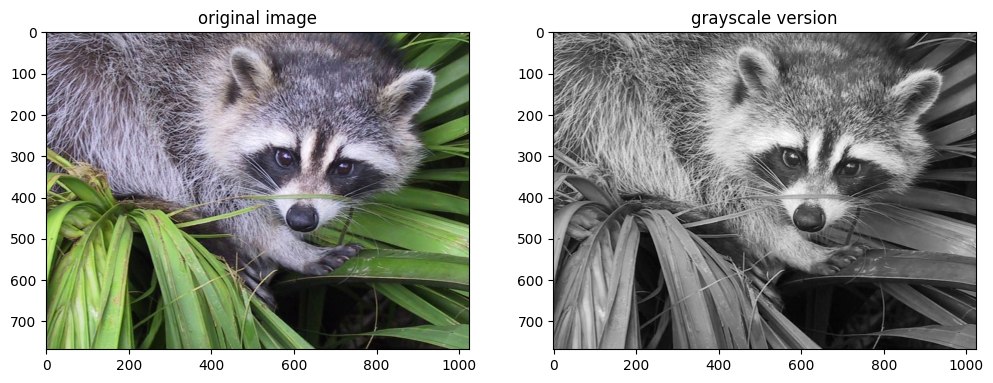

CPU times: user 8.04 s, sys: 105 ms, total: 8.15 s
Wall time: 8.06 s


In [ ]:
%%time
# Test your code for version A in this cell.
plt.figure(2,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(toGrayScale_A(im),cmap="gray")
plt.title("grayscale version")
plt.show()

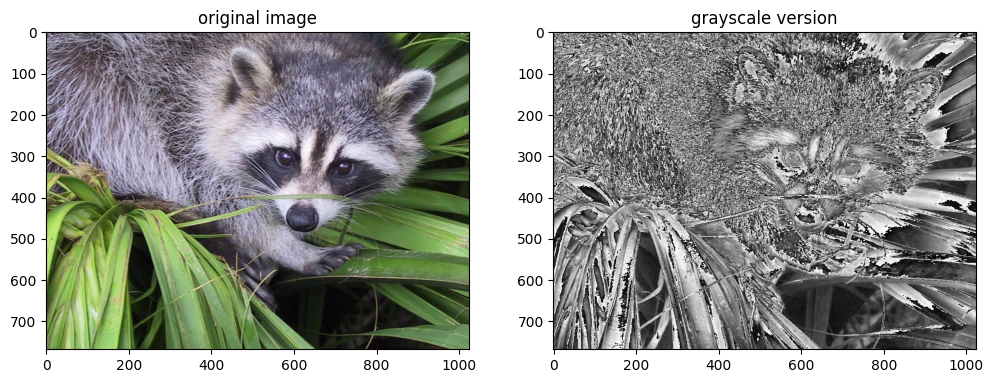

CPU times: user 626 ms, sys: 149 ms, total: 775 ms
Wall time: 662 ms


In [ ]:
%%time
# Test your code for version B in this cell.
plt.figure(3,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(toGrayScale_B(im),cmap="gray")
plt.title("grayscale version")
plt.show()

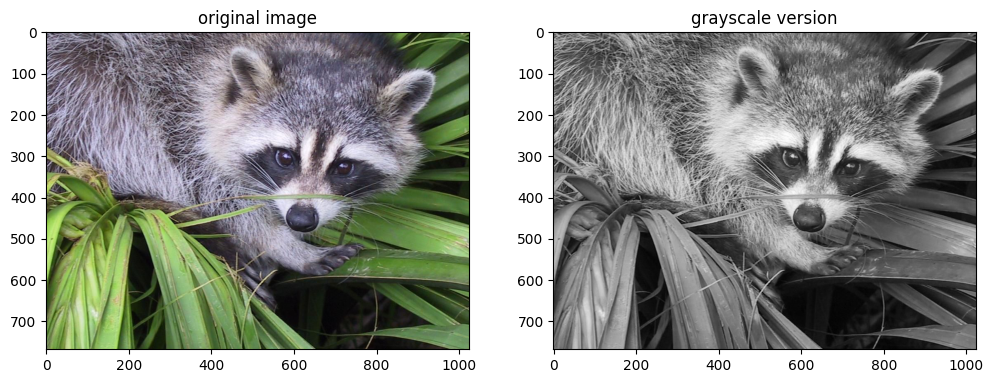

CPU times: user 782 ms, sys: 97.8 ms, total: 880 ms
Wall time: 838 ms


In [ ]:
%%time
plt.figure(4,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(toGrayScale_C(im),cmap="gray")
plt.title("grayscale version")
plt.show()

(a) What perceptual issues arise when using a "simple average" formula to compute a grayscale image?

The most obvious perceptual issue that arises from using this method is that the image is returned to you distorted. It almost looks like the saturation of the image is cranked to max and the clarity of the image is lost entirely, although you can still tell what its supposed to be.

Note: this problem should teach you to avoid using for-loops (or other explicit loops) when coding operations over image pixels or, more generally, matrix elements! Compare the running times reported in the last three cells and decide for yourself what would happen if the image was much larger and you had to run your code on many images. Numpy was designed to avoid that type of code. You should always use basic 'numpy' operators for matrices that make your code both efficient and simple. In many cases, numpy's code should look exactly like linear algebraic equations. When basic linear algebraic operators are not enough, you should look for appropriate "vectorized" functions (e.g. like 'dot'). Learning how to use vectorized functions is significant for proper numpy coding. You should also get comfortable with "slicing" and "reshaping" operations as soon as possible - they are ubiquitous in numpy and critical for effective code.

We will now write two more functions:
- Your first function should add 15 to each value of the input image. Set all pixel values greater than 255 to 255.
- Your second function should calculate the median of all values in the image. Then, threshold the input image by the median value you calculated (i.e., set all values greater than the median to 0, and all values less than or equal to the median to 1). This is an example of a binary image.

Display the output of each of your functions next to a copy of the original image.

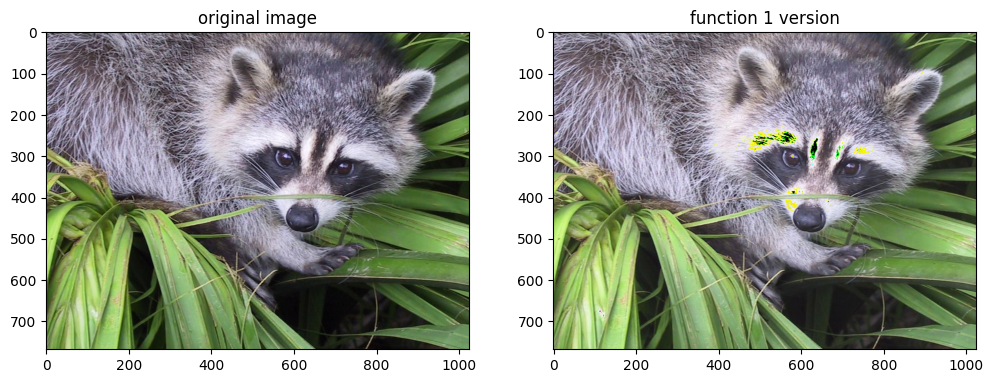

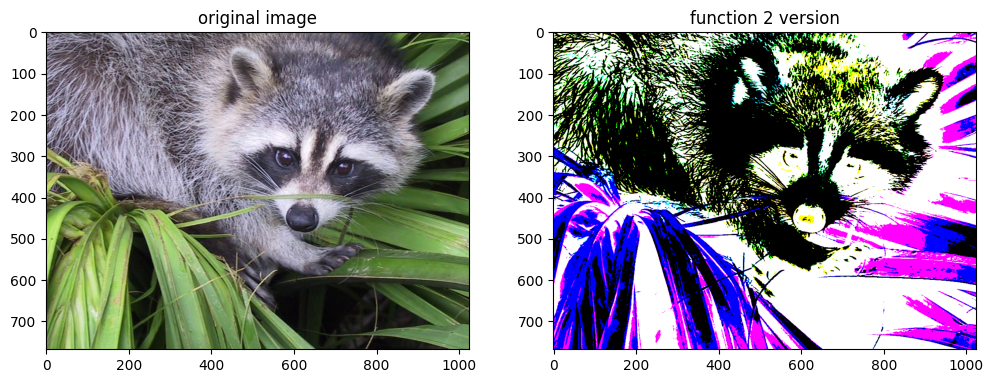

In [ ]:
# Your code here

def function_1(color_image):
  input_image = np.array(color_image)
  height, width, channels = input_image.shape
  new_image = np.zeros((height, width, channels), dtype=np.uint8)

  for i in range(height):
    for j in range(width):
      for k in range(channels):
        new_values = input_image[i,j,k] + 15
        if new_values > 255:
          new_values = 255
        else:
          new_image[i,j,k] = new_values
  return new_image


plt.figure(4,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(function_1(im),cmap="gray")
plt.title("function 1 version")
plt.show()

def function_2(color_image):
  input_image = np.array(color_image)
  height, width, channels = input_image.shape
  new_image = np.zeros((height, width, channels), dtype=np.uint8)

  median = np.median(input_image)
  for i in range(height):
    for j in range(width):
      for k in range(channels):
        if input_image[i,j,k] > median:
          new_image[i,j,k] = 0
        else:
          new_image[i,j,k] = 255
  return new_image


plt.figure(4,figsize = (12, 8))
plt.subplot(121)
plt.imshow(im)
plt.title("original image")
plt.subplot(122)
plt.imshow(function_2(im),cmap="gray")
plt.title("function 2 version")
plt.show()

# Problem 3: Pixel Shuffling

##### Write code that randomly shuffles all grayscale image pixels using function numpy.random.shuffle. Show the original image and two shuffled results. Display the histograms of both the original and the "shuffled" images. Add a markdown cell describing what you notice about the histograms.

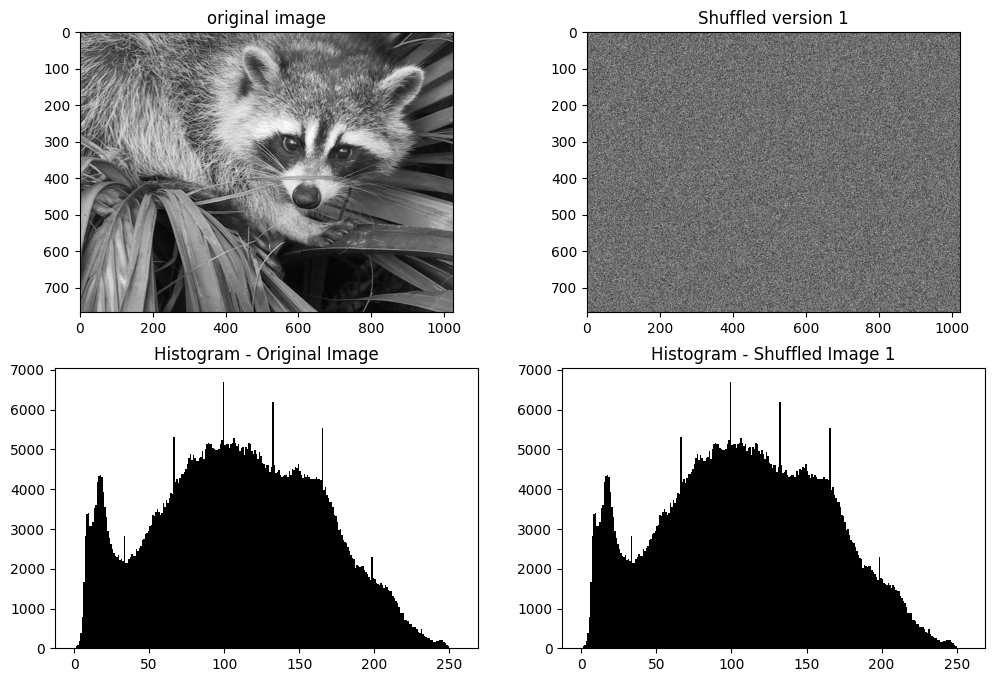

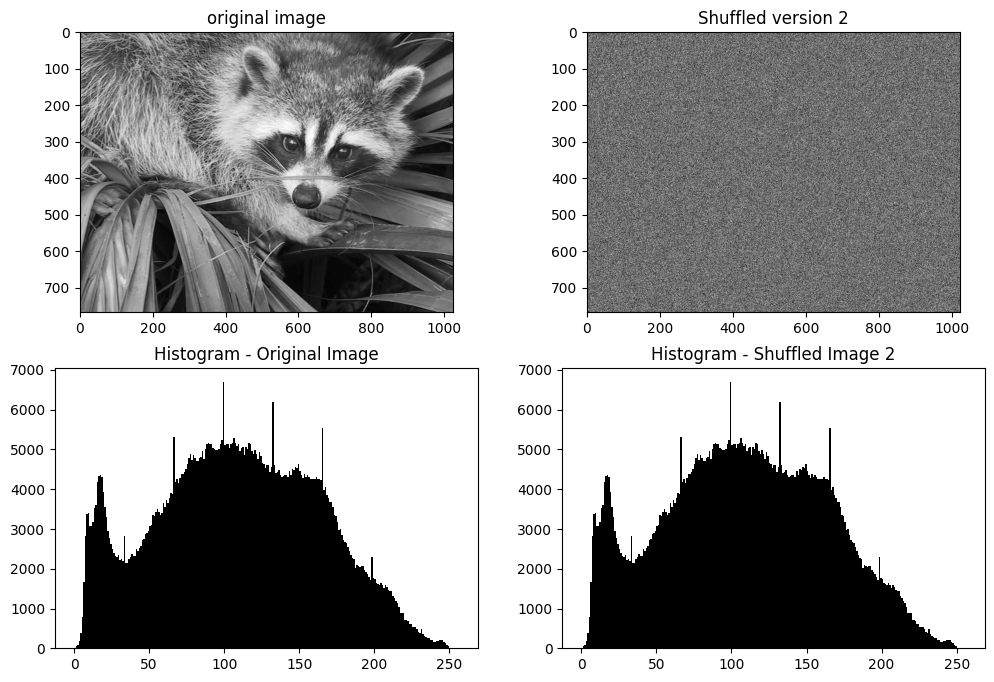

In [ ]:
# Solution: write your code in this cell. Show one image and the results of shuffling.

def image_shuffle(color_image):
  input_image = color_image.flatten()
  np.random.shuffle(input_image)

  random_image = input_image.reshape(color_image.shape)
  return random_image

grayscale_im = toGrayScale_C(im)

shuffled_1 = image_shuffle(grayscale_im)

plt.figure(figsize = (12, 8))
plt.subplot(221)
plt.imshow(grayscale_im, cmap="gray")
plt.title("original image")
plt.subplot(222)
plt.imshow(shuffled_1,cmap="gray")
plt.title("Shuffled version 1")

plt.subplot(223)
plt.hist(grayscale_im.ravel(), bins=256, range=[0, 256], color='black')
plt.title("Histogram - Original Image")

plt.subplot(224)
plt.hist(shuffled_1.ravel(), bins=256, range=[0, 256], color='black')
plt.title("Histogram - Shuffled Image 1")

plt.show()


shuffled_2 = image_shuffle(grayscale_im)
plt.figure(figsize = (12, 8))
plt.subplot(221)
plt.imshow(grayscale_im, cmap="gray")
plt.title("original image")
plt.subplot(222)
plt.imshow(shuffled_2,cmap="gray")
plt.title("Shuffled version 2")

plt.subplot(223)
plt.hist(grayscale_im.ravel(), bins=256, range=[0, 256], color='black')
plt.title("Histogram - Original Image")

plt.subplot(224)
plt.hist(shuffled_2.ravel(), bins=256, range=[0, 256], color='black')
plt.title("Histogram - Shuffled Image 2")

plt.show()


I notice that all of the histograms are pretty much the same. I dont see any changes between the 4 of them.


# Problem 4: Noise Cleaning

Load the images br, noisy1, and noisy2. For each filtering step, include the resulting filtered images, and answer the questions in a markdown cell underneath.

- Which image has Gaussian noise, and which image has Salt \& Pepper noise?
- Use a 1x3 horizontal median filter to clean both images. What are the resulting mean squared errors (MSEs)?
- Use a 3x3 median filter to clean both images. What are the resulting MSEs?
- Use a 3x3 mean filter to clean both images. What are the resulting MSEs?
- Discuss your results; which filter(s) worked best for which images, and why?


# 1. I believe that the image with Gaussian noise is noisy2.png, while the image with salt and pepper noise is noisy1.png. I think this because noisy2 has a much "smoother" look, which is probably due to the distribution you would get from a gaussian noise histogram. noisy1 has a bit of randomness to it and the noise seems more extreme.

# 2. noisy1.png MSE: 0.0009919325, noisy2.png MSE: 0.004722886

# 3. noisy1.png 3x3 MSE: 0.0005090391 , noisy2.png 3x3 MSE: 0.0021845729

# 4. noisy1.png mean filter MSE: 0.0040674917 , noisy2.png mean filter MSE: 0.003616189

# 5. In my results, I think that, across the board, the 3x3 Median filter performed the best. It provided sharp details, removal of most noise, and it preserved details when it couldnt remove noise. The mean filter was not able to make the salt and pepper noise disappear at all. I think that the 3x3 Median filter was the best option to clean noisy.png, as it completely wiped the noise from the image while preserving all the details. I think that for noisy2.png, the mean filter was the best choice, as it cleaned the image as best as it could while not blurring it as much as the 3x3 Median filter and removing more noise (seemingly) than the 1x3 Median filter

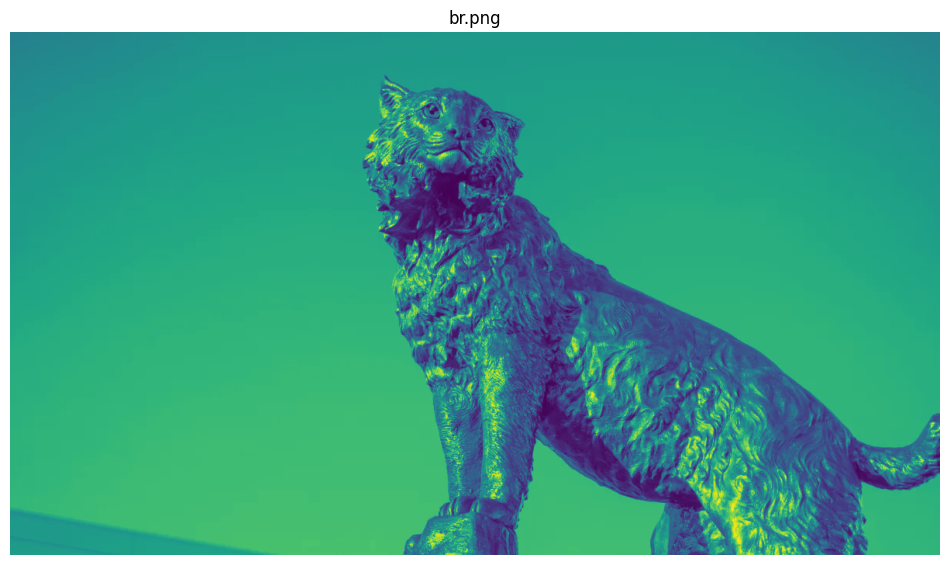

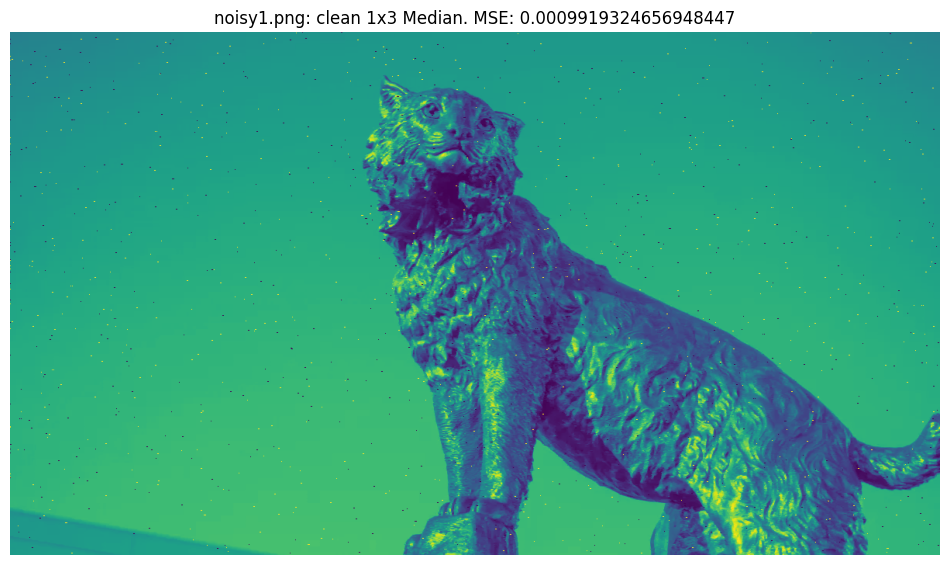

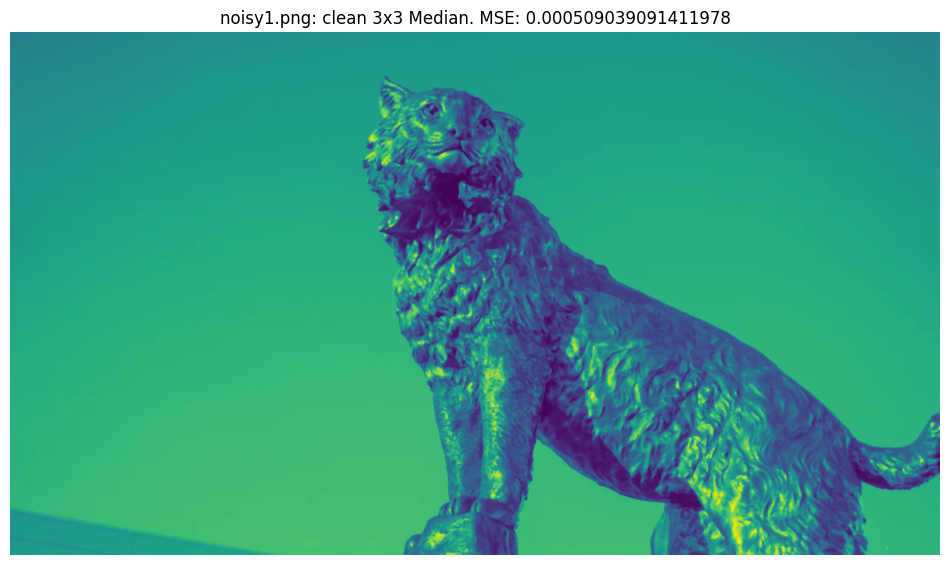

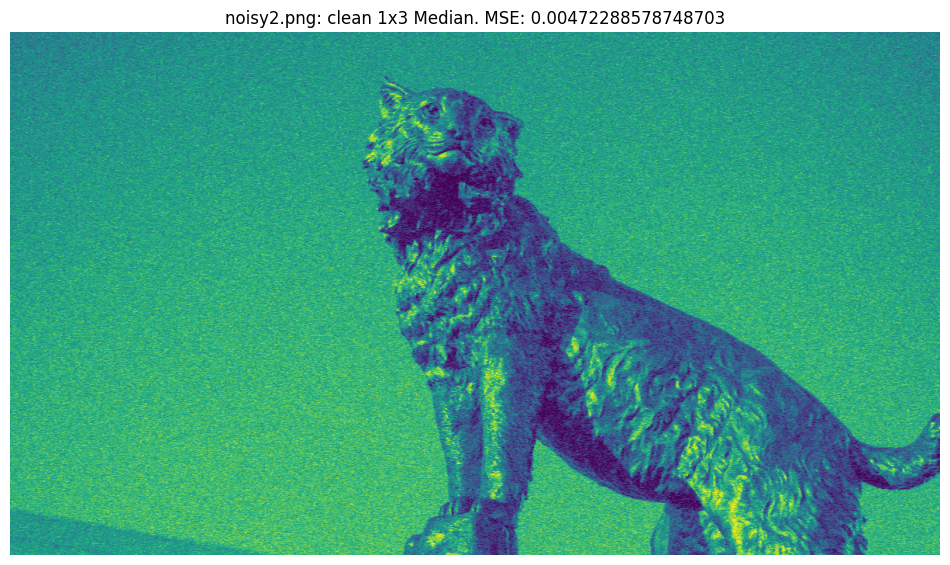

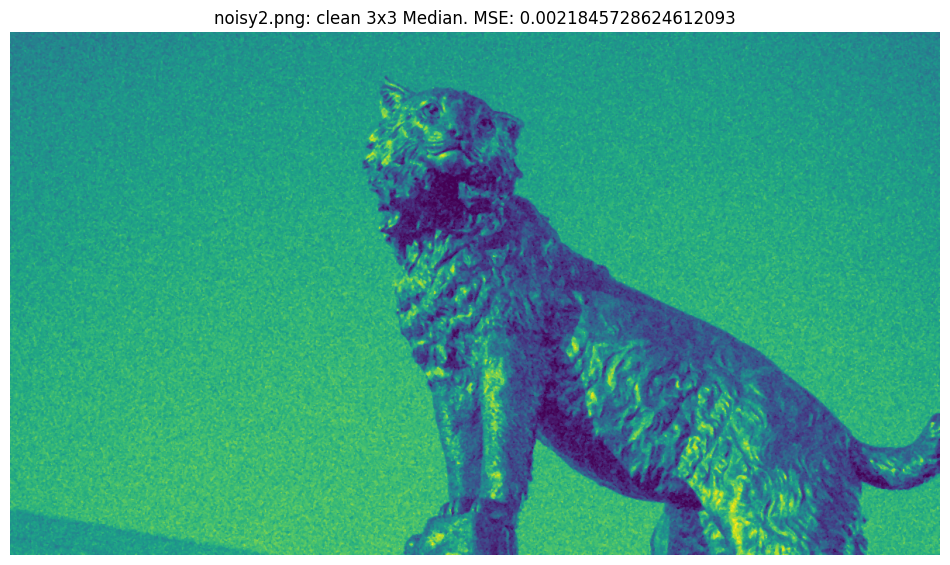

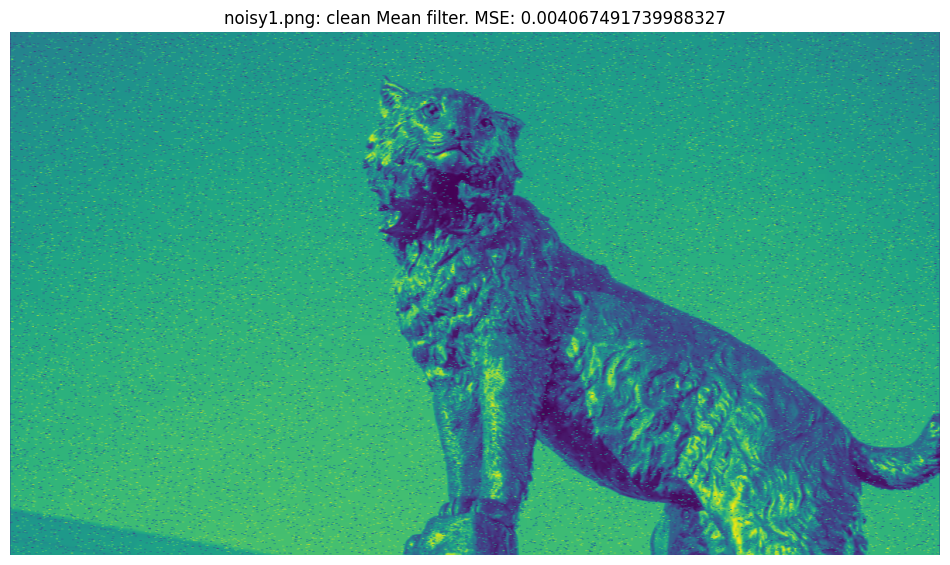

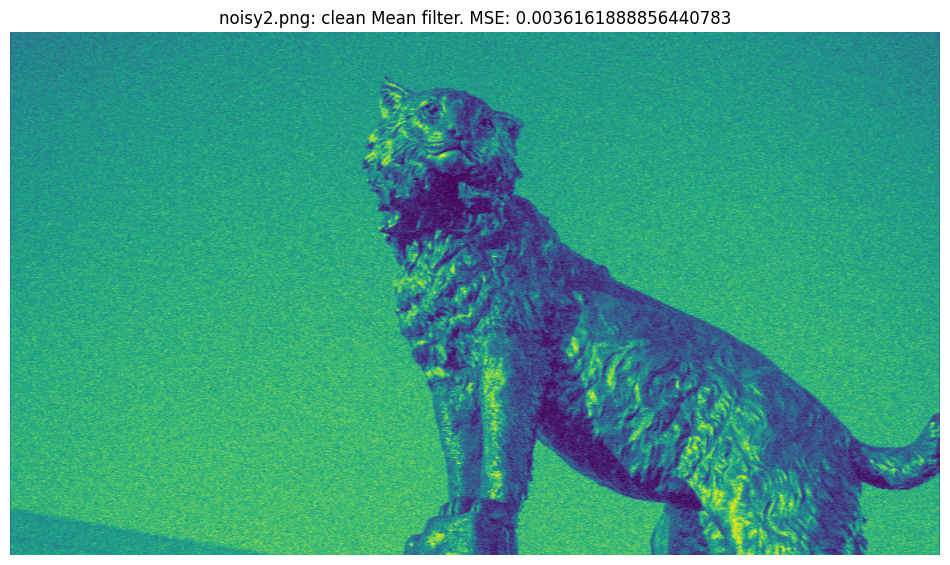

0.0009919325 0.004722886 0.0005090391 0.0021845729 0.0040674917 0.003616189


In [ ]:
# Your code here

# these lines are to upload the images from my files
# from google.colab import files
# uploaded = files.upload()

img = image.imread('br.png')
img2 = image.imread('noisy1.png')
img3 = image.imread('noisy2.png')

def median_filter(image, kernel_rows, kernel_cols):
    return scipy.ndimage.median_filter(image, size=(kernel_rows,kernel_cols))

def mean_filter(image, kernel_size):
    kernel = np.ones((1, kernel_size), np.float32) / kernel_size
    return scipy.ndimage.convolve(image, kernel, mode='constant')

# the 1x3 median filters
img2_clean = median_filter(img2, 1, 3)
img3_clean = median_filter(img3, 1, 3)
mse1_img2 = np.square(np.subtract(img,img2_clean)).mean()
mse1_img3 = np.square(np.subtract(img,img3_clean)).mean()

# the 3x3 median filters
img2_clean_3x3 = median_filter(img2, 3, 3)
img3_clean_3x3 = median_filter(img3, 3, 3)
mse2_img2 = np.square(np.subtract(img,img2_clean_3x3)).mean()
mse2_img3 = np.square(np.subtract(img,img3_clean_3x3)).mean()

# the 3x3 mean filter
img2_clean_mean = mean_filter(img2, 3)
img3_clean_mean = mean_filter(img3, 3)
mse3_img2 = np.square(np.subtract(img,img2_clean_mean)).mean()
mse3_img3 = np.square(np.subtract(img,img3_clean_mean)).mean()

# the 1x3 median filter makes the cleaned images look more blurred.
# the salt and pepper noise is removed but the image still loses detail compared to br.png
# the gaussian noise remains but is dialed down and detail lost its sharpness.

# # Display the image
plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.title("br.png")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img2_clean)
plt.title(f"noisy1.png: clean 1x3 Median. MSE: {mse1_img2}")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img2_clean_3x3)
plt.title(f"noisy1.png: clean 3x3 Median. MSE: {mse2_img2}")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img3_clean)
plt.title(f"noisy2.png: clean 1x3 Median. MSE: {mse1_img3}")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img3_clean_3x3)
plt.title(f"noisy2.png: clean 3x3 Median. MSE: {mse2_img3}")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img2_clean_mean)
plt.title(f"noisy1.png: clean Mean filter. MSE: {mse3_img2}")
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(img3_clean_mean)
plt.title(f"noisy2.png: clean Mean filter. MSE: {mse3_img3}")
plt.axis('off')
plt.show()

print(mse1_img2, mse1_img3, mse2_img2, mse2_img3, mse3_img2, mse3_img3)

# Problem 5: Median Filtering

##### Prove that median filtering in not a linear image transormation. HINT: find a counter example showing that for some vectors of the same dimensions $A$ and $B$, $$Med(A + B)\neq Med(A) + Med(B)$$  where operation $Med(X)$ returns median of the elements of vector $X$.

# **Solution: To prove this, we need two vectors A and B where A = [1,2,9] and B = [3,5,4]. To get Med(A) + Med(B), we must find the medians of both A and B. Med(A) = 2 and Med(B) = 4. Therefore, Med(A) + Med(B) == 2 + 4 == 6. Next, we must add both vectors together: [1 + 3, 2 + 5, 9 + 4] == [4,7,13] == Med(A + B) = 7, which shows that Med(A) + Med(B) != Med(A + B)**

# Problem 6: Image Differentiation and Noise

##### (a) Image differentiation: Write your own code for a python function estimating partial derivatives $d(x,y):=\frac{\partial}{\partial x} f(x,y)$ of any greyscale image $f$ with respect to variable $x$. The function should return a real-valued matrix of the same size as the input image $f$. Use the "backward" difference approximation $$\frac{\partial}{\partial x} f(x,y)\approx \frac{f(x,y)-f(x-\Delta,y)}{\Delta}$$ where $\Delta$ is the distance between pixels (you  can assume  $\Delta=1$). As mentioned earlier, your numpy code should not use (double) for-loops for traversing the elements of matrices. This is highly inefficient. You should learn to use appropriate numpy functions that avoid this. For example, for this excercise you can use numpy.roll to compute image with pixels shifted to the left or right and use linear operations over images as matrices (pointwise addition/subtraction).

In [5]:
def partial_der(image):
  input_image = np.array(image)

  shift = np.roll(input_image, shift=1, axis=1)
  derivative = input_image - shift
  derivative[:, 0] = np.zeros_like(derivative[:, 0])

  return derivative


##### (b): Apply your code in (a) to some grey-scale image $f$. Display the following images: the original image $f$ and its derivative $g=\frac{\partial}{\partial x} f$ (real-valued). Your matplotlib plots for $f$ and $g$ should include the "color bar" clearly indicating the corresponding ranges.
Note: to display real-valued matrix with negative and positive values as some image, matplotlib can use some (typically linear) range transformation or point processing that maps the whole range of the matrix values onto an interval of grey-scale intensities, e.g. [0,255]. The color bar can illustrate such transformation showing which real-values in the matrix range correspond to different grey-levels in the displayed image. You can expect that for the matrix of derivatives $g$ the medium grey-level (125) would correspond to zero derivatives, while the negative derivatives are displayed by darker intensities [0,125], and positive derivatives are displayed by brighter intensities [125,255].

Besides greyscale [0,255], matplotlib can map the range of a matrix values onto some colors intervals (from red to blue or from brown to yellow), thus the name "color bar". It can also use some non-linear (e.g. logarithmic) range maps that maybe useful for visualizing certain real-valued matrices, e.g. with many extremely small (or large) positive values.

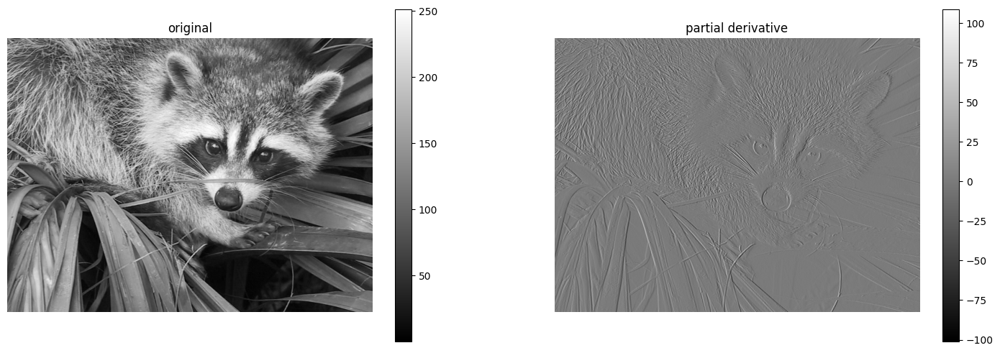

In [8]:
# Solution: write your code in this cell

grayscale_im = toGrayScale_C(im)
plt.figure(figsize=(18, 6))
plt.subplot(121)
im1 = plt.imshow(grayscale_im, cmap="gray")
plt.title("original")
plt.colorbar(im1)
plt.axis('off')

plt.subplot(122)
im2 = plt.imshow(partial_der(grayscale_im), cmap="gray")
plt.title("partial derivative")
plt.colorbar(im2)
plt.axis('off')
plt.show()

# Problem 8: Harris Corners

##### (a) In this problem we use $\nabla I (x,y)$ to denote a gradient of image intensities at point $(x,y)$ only to emphasize this dependence of the gradient on location. Assume that $\nabla I (x,y)$  is a non-zero vector at a given point $(x,y)$. What is the rank of matrix $\nabla I(x,y) \cdot \nabla I^T(x,y)$ and why?

# Solution: when gradient I(x,y) != 0, gradient I(x,y) = [I<sub>x</sub>, I<sub>y</sub>]. Therefore, I(x,y) * I(x,y)<sup>T</sup> ==  [I<sub>x</sub>, I<sub>y</sub>] * [I<sub>x</sub>, I<sub>y</sub>] == [I<sup>2</sup><sub>x</sub>, I<sub>xy</sub>, I<sub>yx</sub>, I<sup>2</sup><sub>y</sub>]. Therefore, the rank is 1 because there is only 1 linearly independent row.

##### (b) Assume that an image patch (window $w$) contains a straight intensity edge. What should be the rank of Harris matrix  at that patch/window $M_w = \sum_{(x,y)\in w} \nabla I(x,y) \cdot \nabla I^T(x,y)$ and why?

# Solution: The rank of the Harris Matrix should be 1 because all of the gradient vectors align in the same direction.

##### (c) What is the rank of Harris matrix for window $W_c$ containing a corner at an intersection of two straight edges? Provide a formal proof. HINT: You can assume that pixels in $W_c$ have either a zero-gradient, or one of two distint gradient vectors corresponding to two straight edges.

Solution:  

# Problem 9: Canny Edge Detection

In this problem, you are required to write a function that performs Canny Edge Detection. The function has the following specifications:

- It takes in two inputs: a grayscale image, and a threshold $t_e$.
- It returns the edge image.

A brief description of the algorithm is given below. Make sure your function reproduces the each step as given.

- Smoothing: It is inevitable that all images taken from a camera will contain some amount of noise. To prevent noise from being mistaken for edges, noise must be reduced. Therefore the image is first smoothed by applying a Gaussian filter. A Gaussian kernel with standard deviation $\sigma = 1.4$ (shown below) is to be used.

$$k = \frac{1}{159} \cdot \begin{bmatrix}
2 & 4 & 5 & 4 & 2\\
4 & 9 & 12 & 9 & 4\\
5 & 12 & 15 & 12 & 5\\
4 & 9 & 12 & 9 & 4\\
2 & 4 & 5 & 4 & 2
\end{bmatrix}
$$

- Finding Gradients: The next step is to find the horizontal and vertical gradients of the smoothed image using the Sobel operators. The gradient images in the x and y-direction, $G_x$ and $G_y$ are found by applying the kernels $k_x$ and $k_y$ given below:

$$k_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix},
k_y = \begin{bmatrix}
-1 & -2 & -1\\
0 & 0 & 0\\
1 & 2 & 1
\end{bmatrix}.
$$

The corresponding gradient magnitude image is computed using:

$$|G| = \sqrt{G_x^2 + G_y^2},$$

and the edge direction image is calculated as follows:

$$G_{\theta} = arctan(\frac{G_y}{G_x}).$$

- Non-maximum Suppression (NMS): The purpose of this step is to convert the thick edges in the gradient magnitude image to "sharp" edges. This is done by preserving all local maxima in the gradient image, and deleting everything else. This is carried out by recursively performing the following steps for each pixel in the gradient image:

- Round the gradient direction $\theta$ to nearest 45 degrees, corresponding to the use of an 8-connected neighbourhood.

- Compare the edge strength of the current pixel with the edge strength of the pixel in the positive and negative gradient direction i.e. if the gradient direction is north ($\theta = 90$ degrees), then compare with the pixels to the north and south.

- If the edge strength of the current pixel is largest; preserve the value of the edge strength. If not, suppress (remove) the value.

- Thresholding: The edge-pixels remaining after the NMS step are (still) marked with their strength. Many of these will probably be true edges in the image, but some may be caused by noise or color variations. The simplest way to remove these would be to use a threshold, so that only edges stronger than a certain value would be preserved. Use the input $t_e$ to perform thresholding on the non-maximum suppressed magnitude image.

- Evaluate your canny edge detection function on b.jpg for a suitable value of $t_e$ that retains the structural edges, and removes the noisy ones. What threshold did you choose?

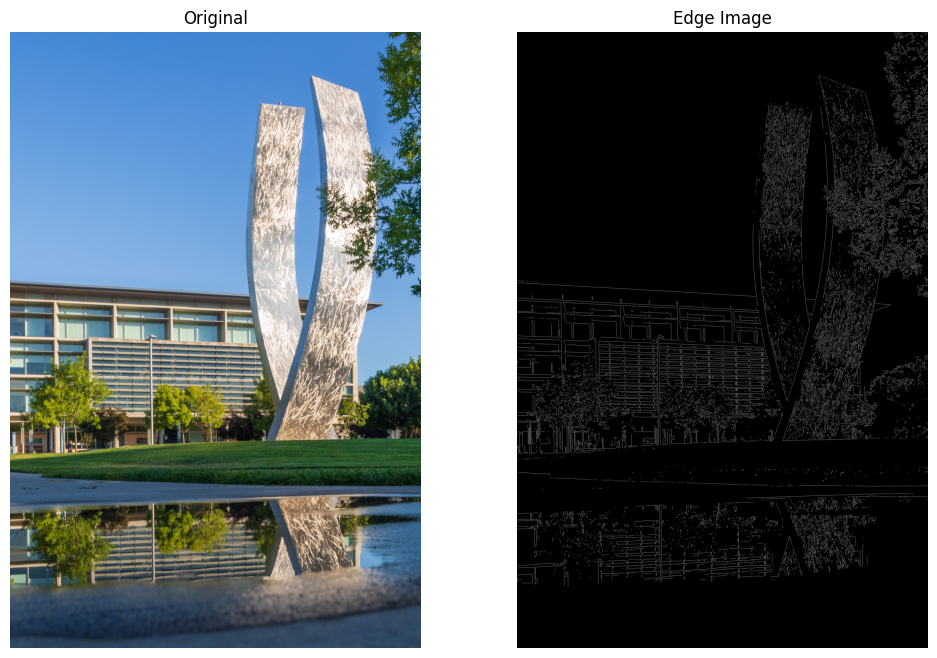

In [12]:
import cv2
import numpy as np

# from google.colab import files
# uploaded = files.upload()

# # the parameters of this function are the magnitude and direction images of the gradient x,y images.
def non_maximum_suppression(magnitude, direction):
  height, width = magnitude.shape
  suppressed = np.zeros((height, width), dtype=np.float32)

  angle = direction * (180 / np.pi)
  angle = np.where(angle < 0, angle + 180, angle)

  for i in range(1, height - 1):
    for j in range(1, width - 1):
        pixel_1, pixel_2 = 255, 255

        if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
            pixel_1 = magnitude[i, j + 1]
            pixel_2 = magnitude[i, j - 1]

        elif 22.5 <= angle[i, j] < 67.5:
            pixel_1 = magnitude[i + 1, j - 1]
            pixel_2 = magnitude[i - 1, j + 1]

        elif 67.5 <= angle[i, j] < 112.5:
            pixel_1 = magnitude[i + 1, j]
            pixel_2 = magnitude[i - 1, j]

        elif 112.5 <= angle[i, j] < 157.5:
            pixel_1 = magnitude[i - 1, j - 1]
            pixel_2 = magnitude[i + 1, j + 1]

        if magnitude[i, j] >= pixel_1 and magnitude[i, j] >= pixel_2:
            suppressed[i, j] = magnitude[i, j]
        else:
            suppressed[i, j] = 0

  return suppressed

def canny_edge_detection(image, threshold):
  smoothed_im = cv2.GaussianBlur(image, (5,5), 1.4) # ok, so the smoothing is working. making the image blur a bit

  gradient_x = cv2.Sobel(smoothed_im, cv2.CV_64F, 1, 0, ksize=3) # (1,0) for x axis, cv2.CV64F makes it a 64bit floating point matrix
  gradient_y = cv2.Sobel(smoothed_im, cv2.CV_64F, 0, 1, ksize=3) # (0,1) for y axis

  # this is the magnitude image
  gradient_magnitude = np.sqrt(np.square(gradient_x) + np.square(gradient_y))

  # this is the edge detection image, which is the direction of the magnitude
  edge_detection_image = np.arctan2(gradient_y, gradient_x)

  # Now, I will do the Non-Maximum suppression
  nms_image = non_maximum_suppression(gradient_magnitude, edge_detection_image)

  edge_image = np.where(nms_image >= threshold, 255, 0).astype(np.uint8)

  return edge_image


im_b = cv2.imread("b.jpg")
converted = cv2.cvtColor(im_b, cv2.COLOR_BGR2RGB)
grayscale_im = toGrayScale_C(converted)

plt.figure(figsize=(12, 8))
plt.subplot(121)
plt.imshow(converted)
plt.title("Original")
plt.axis('off')


plt.subplot(122)
plt.imshow(canny_edge_detection(grayscale_im, 80), cmap='gray')
plt.title("Edge Image")
plt.axis('off')
plt.show()